<a href="https://colab.research.google.com/github/richardso21/GTAgency-OCR/blob/main/Playing_around_with_EAST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!sudo apt install tesseract-ocr libtesseract-dev
!pip install pytesseract

In [2]:
import numpy as np
import cv2
import pytesseract
from pytesseract import Output
from imutils.object_detection import non_max_suppression
from google.colab.patches import cv2_imshow
from PIL import Image

---

In [3]:
images = ["1007-receipt.jpg", "1008-receipt.jpg", "1010-receipt.jpg", "1026-receipt.jpg", "1074-receipt.jpg", "1075-receipt.jpg"]

[INFO] loading EAST text detector...


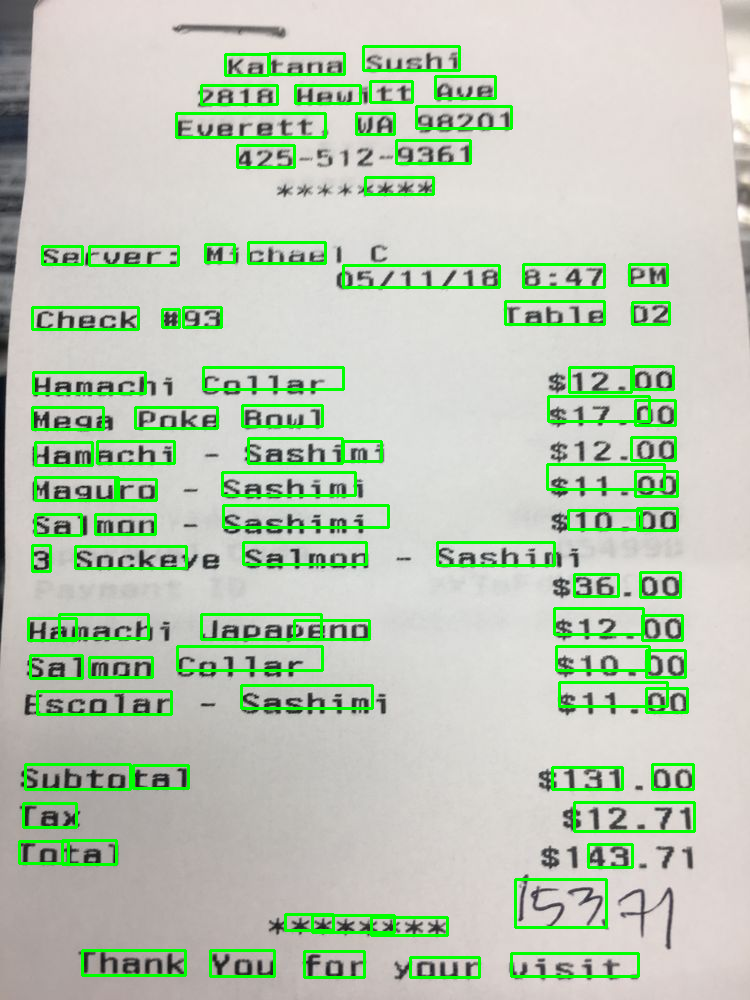

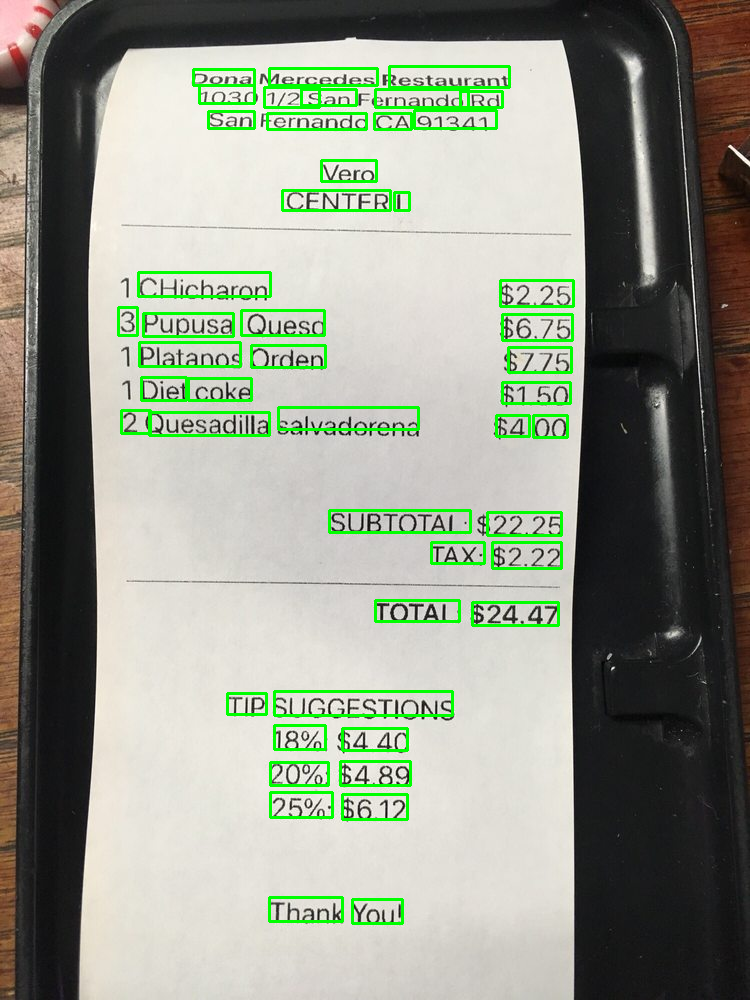

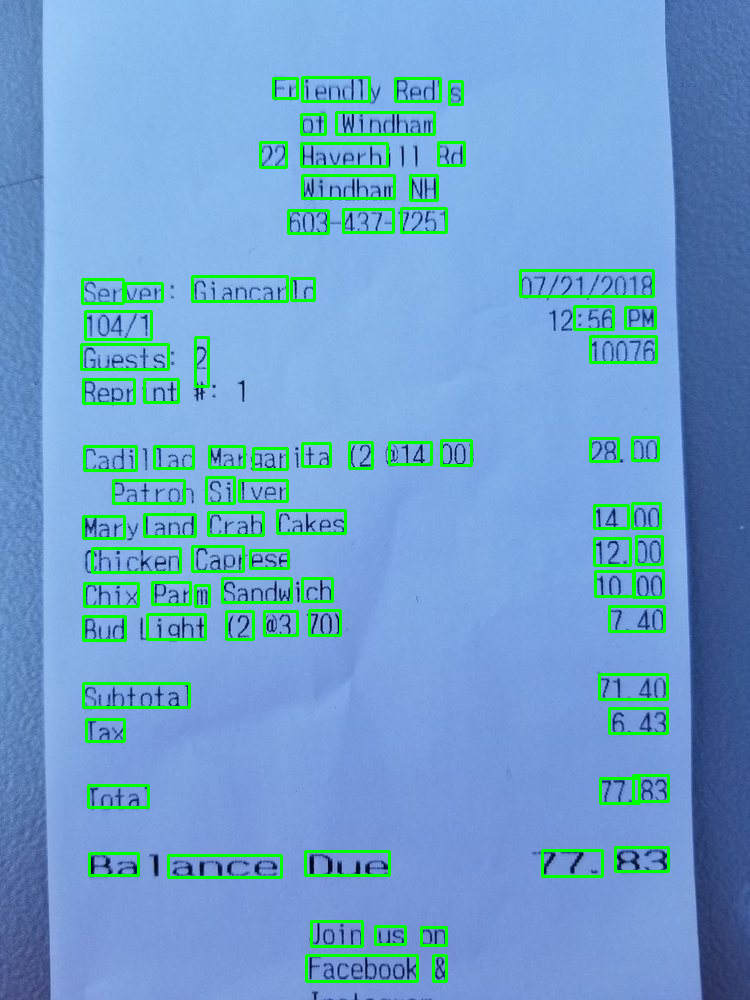

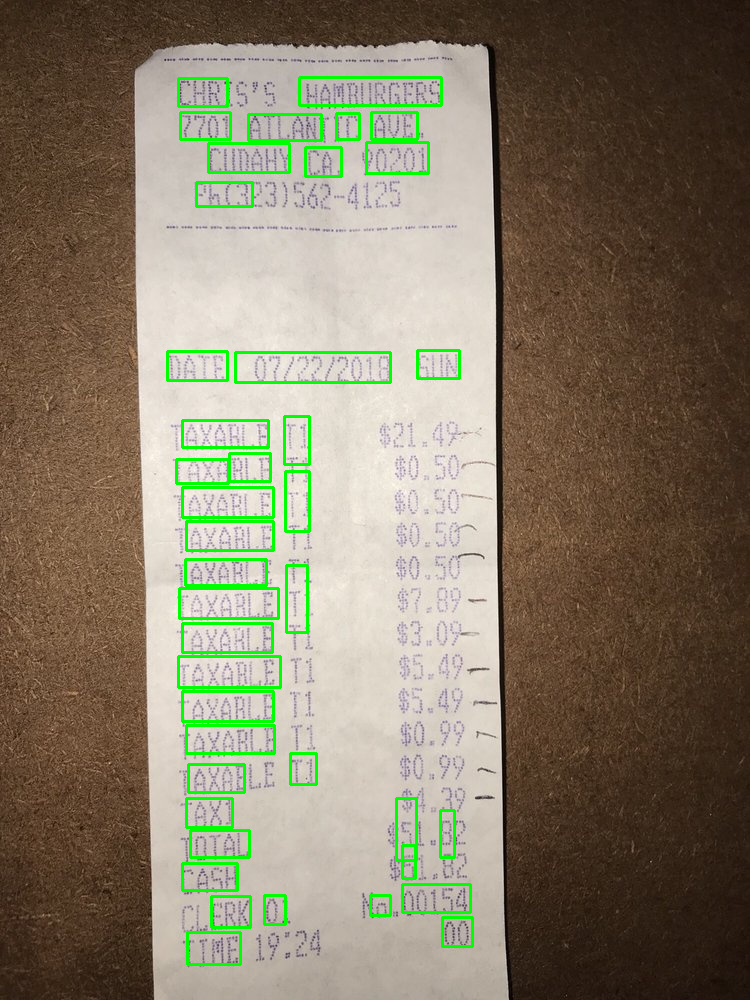

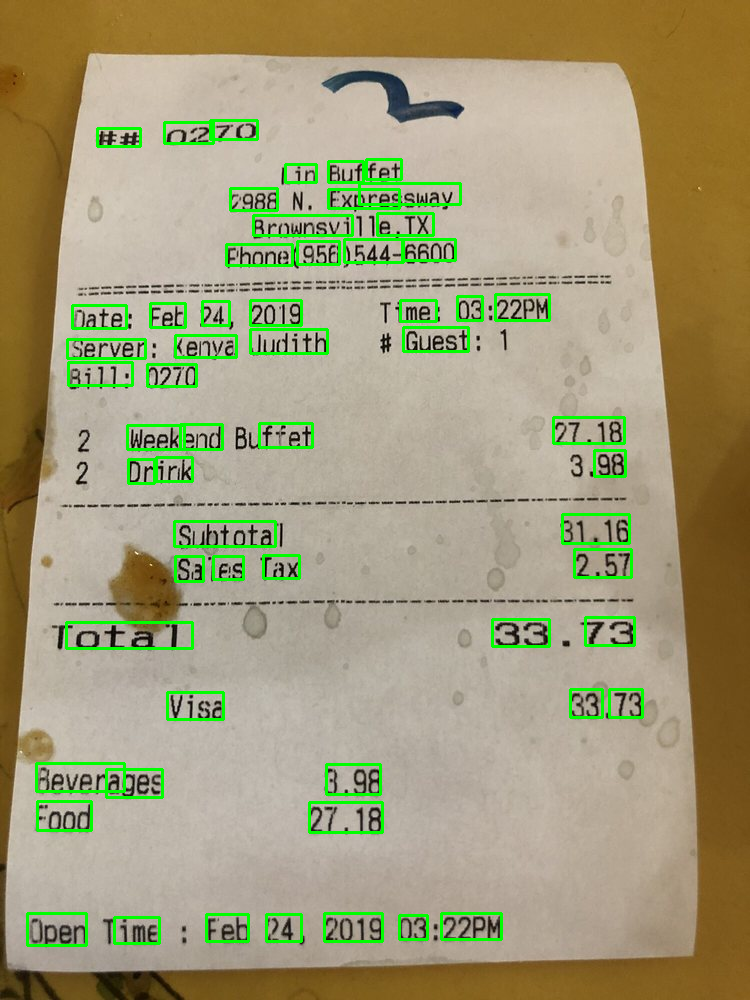

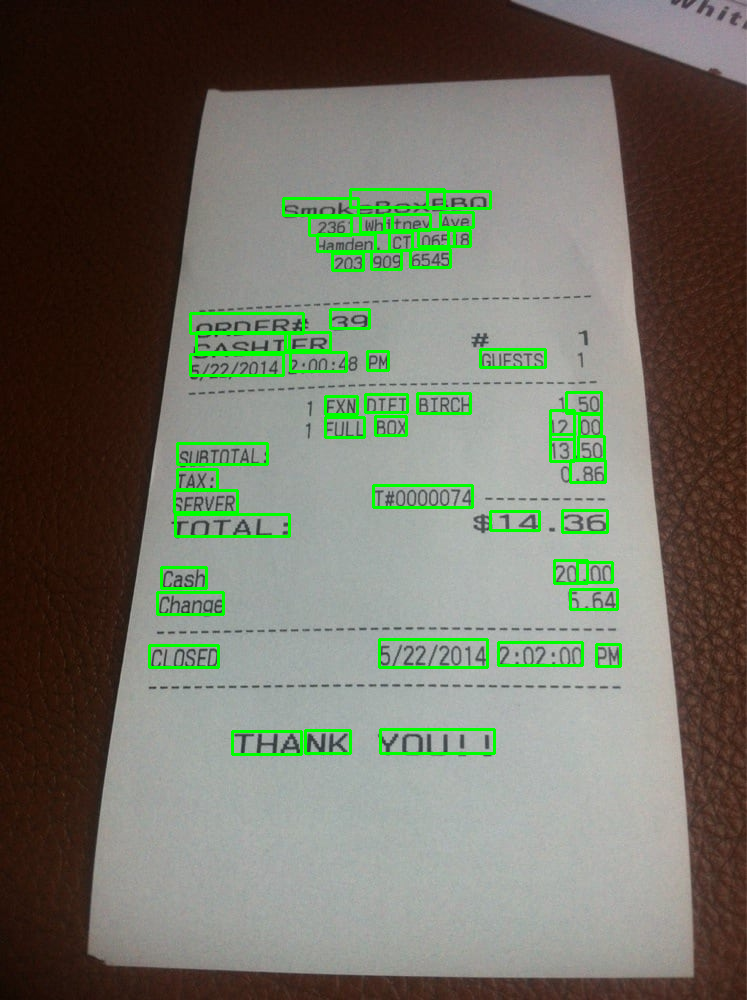

In [9]:
layerNames = [
	"feature_fusion/Conv_7/Sigmoid",
	"feature_fusion/concat_3"]

# load the pre-trained EAST text detector
print("[INFO] loading EAST text detector...")
net = cv2.dnn.readNet("./frozen_east_text_detection.pb")

for i in images:
  image = cv2.imread(i)
  orig = image.copy()

  (H, W) = image.shape[:2]
  (newW, newH) = (1280, 1280)
  rW = W / float(newW)
  rH = H / float(newH)
  image = cv2.resize(image, (newW, newH))
  (H, W) = image.shape[:2]
  blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),
	        (123.68, 116.78, 103.94), swapRB=True, crop=False)
  # start = time.time()
  net.setInput(blob)
  (scores, geometry) = net.forward(layerNames)
  # end = time.time()
  (numRows, numCols) = scores.shape[2:4]
  rects = []
  confidences = []

  # loop over the number of rows
  for y in range(0, numRows):
    # extract the scores (probabilities), followed by the geometrical
    # data used to derive potential bounding box coordinates that
    # surround text
    scoresData = scores[0, 0, y]
    xData0 = geometry[0, 0, y]
    xData1 = geometry[0, 1, y]
    xData2 = geometry[0, 2, y]
    xData3 = geometry[0, 3, y]
    anglesData = geometry[0, 4, y]

    # loop over the number of columns
    for x in range(0, numCols):
      # if our score does not have sufficient probability, ignore it
      #if scoresData[x] < args["min_confidence"]:
      if scoresData[x] < 0.3:
        continue

      # compute the offset factor as our resulting feature maps will
      # be 4x smaller than the input image
      (offsetX, offsetY) = (x * 4.0, y * 4.0)

      # extract the rotation angle for the prediction and then
      # compute the sin and cosine
      angle = anglesData[x]
      cos = np.cos(angle)
      sin = np.sin(angle)

      # use the geometry volume to derive the width and height of
      # the bounding box
      h = xData0[x] + xData2[x]
      w = xData1[x] + xData3[x]

      # compute both the starting and ending (x, y)-coordinates for
      # the text prediction bounding box
      endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
      endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
      startX = int(endX - w)
      startY = int(endY - h)

      # add the bounding box coordinates and probability score to
      # our respective lists
      rects.append((startX, startY, endX, endY))
      confidences.append(scoresData[x])

  # apply non-maxima suppression to suppress weak, overlapping bounding
  # boxes
  boxes = non_max_suppression(np.array(rects), probs=confidences)

  # loop over the bounding boxes
  for (startX, startY, endX, endY) in boxes:
    # scale the bounding box coordinates based on the respective
    # ratios
    startX = int(startX * rW)
    startY = int(startY * rH)
    endX = int(endX * rW)
    endY = int(endY * rH)

    # draw the bounding box on the image
    cv2.rectangle(orig, (startX, startY), (endX, endY), (0, 255, 0), 2)

  # show the output image
  cv2_imshow(orig)

[INFO] loading EAST text detector...


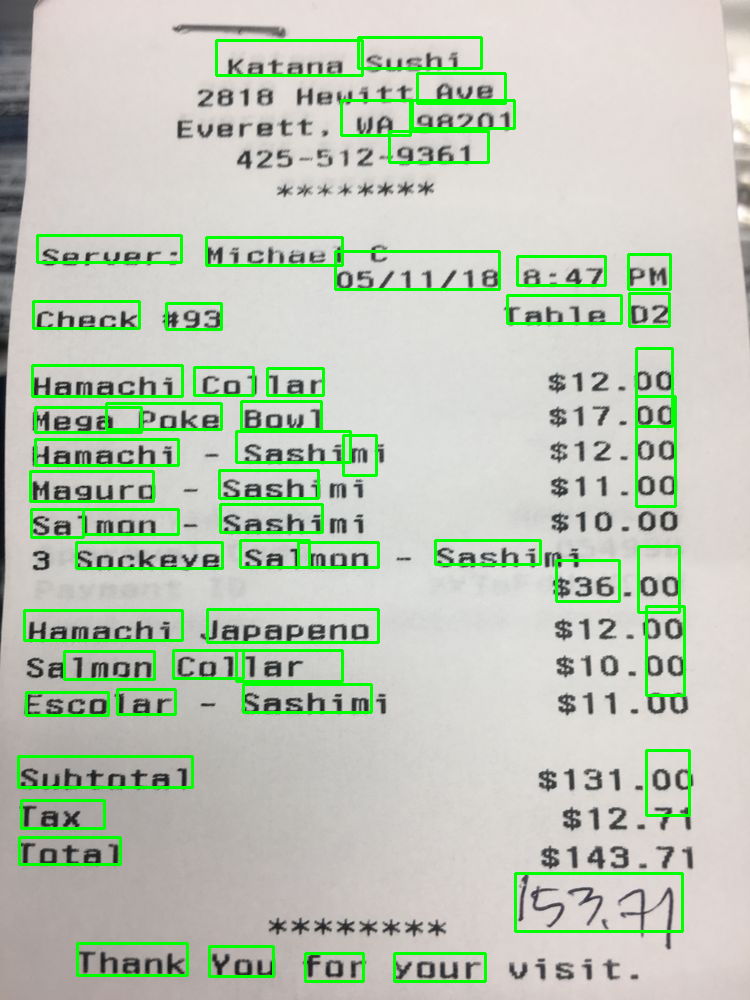

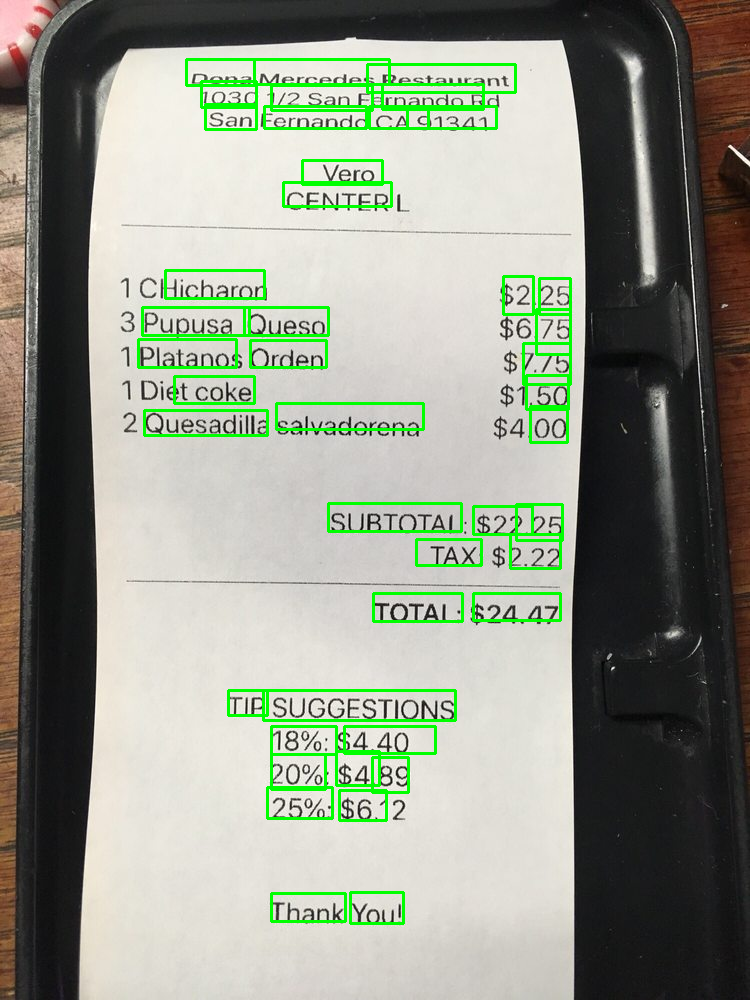

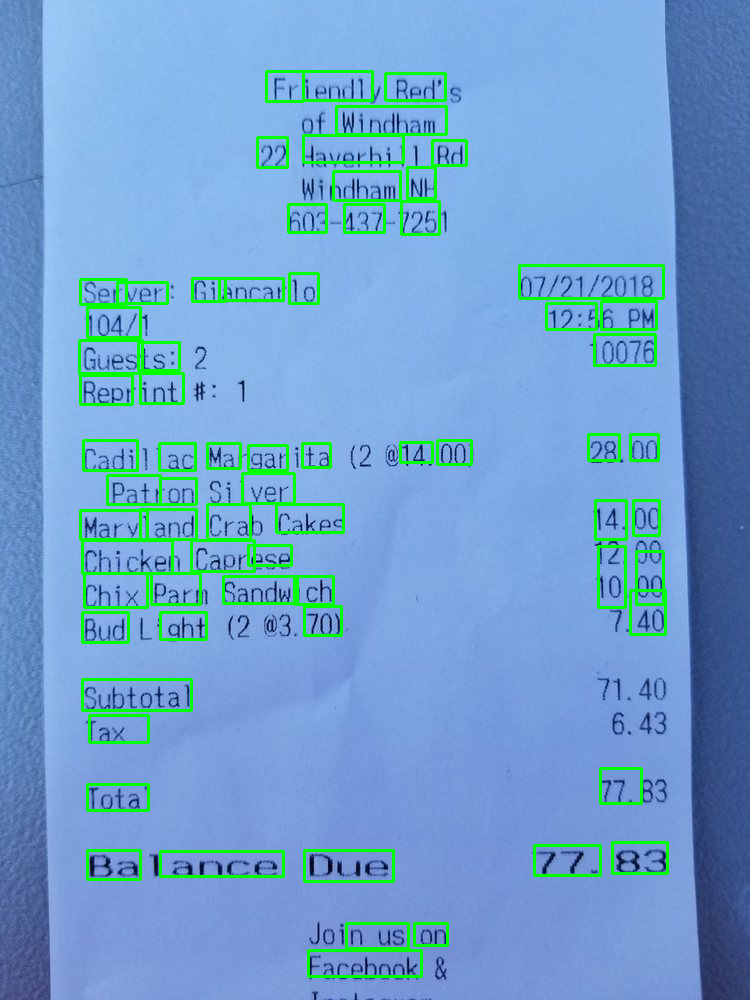

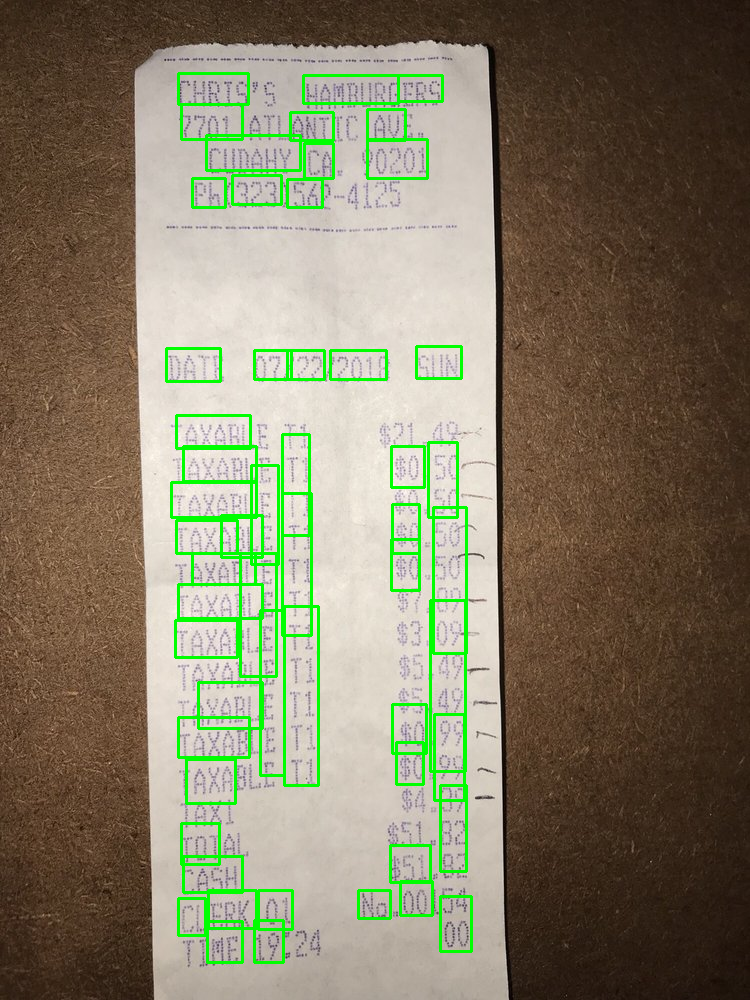

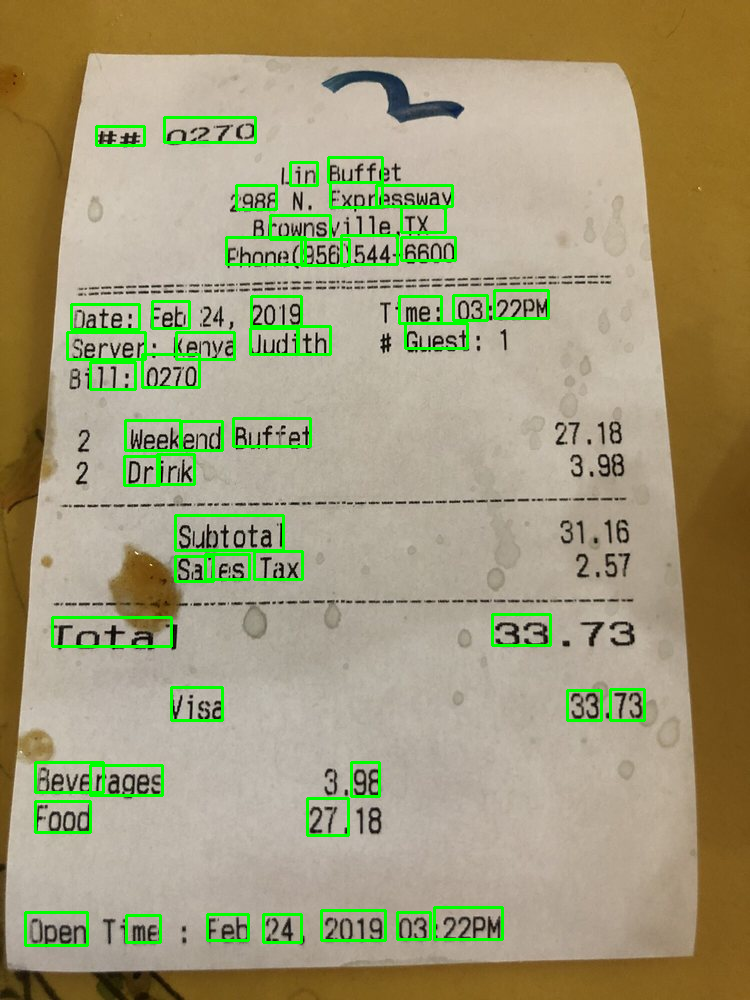

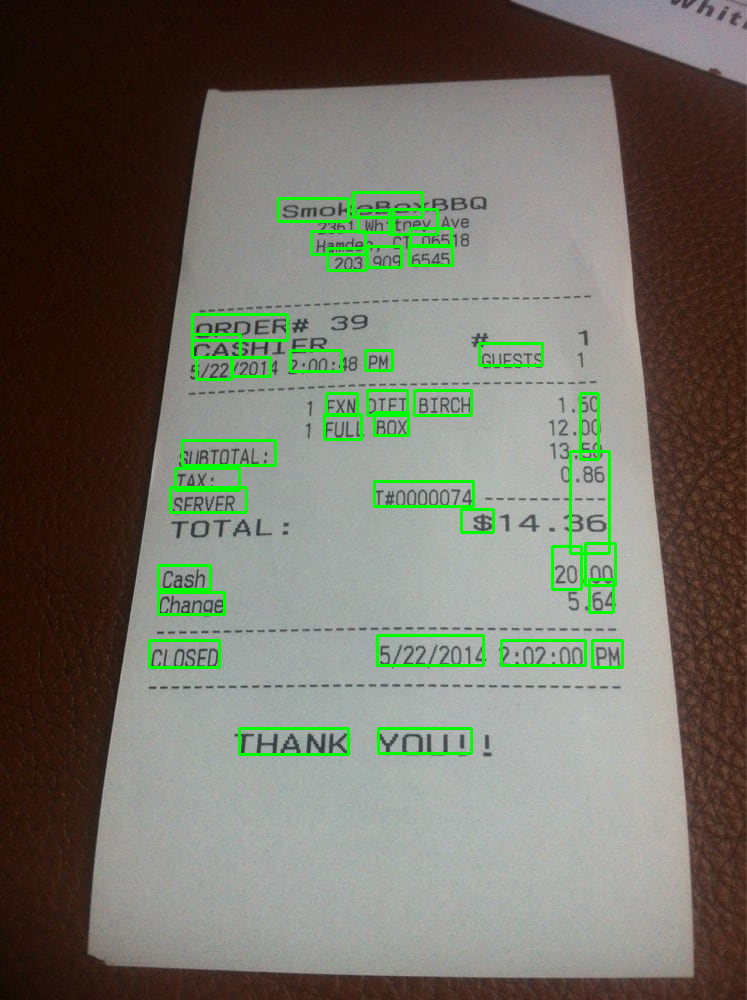

In [7]:
layerNames = [
	"feature_fusion/Conv_7/Sigmoid",
	"feature_fusion/concat_3"]

# load the pre-trained EAST text detector
print("[INFO] loading EAST text detector...")
net = cv2.dnn.readNet("./frozen_east_text_detection.pb")

for i in images:
  image = cv2.imread(i)
  orig = image.copy()
  (H, W) = image.shape[:2]
  (newW, newH) = (640, 640)
  rW = W / float(newW)
  rH = H / float(newH)
  image = cv2.resize(image, (newW, newH))
  (H, W) = image.shape[:2]
  blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),
	        (123.68, 116.78, 103.94), swapRB=True, crop=False)
  # start = time.time()
  net.setInput(blob)
  (scores, geometry) = net.forward(layerNames)
  # end = time.time()
  (numRows, numCols) = scores.shape[2:4]
  rects = []
  confidences = []

  # loop over the number of rows
  for y in range(0, numRows):
    # extract the scores (probabilities), followed by the geometrical
    # data used to derive potential bounding box coordinates that
    # surround text
    scoresData = scores[0, 0, y]
    xData0 = geometry[0, 0, y]
    xData1 = geometry[0, 1, y]
    xData2 = geometry[0, 2, y]
    xData3 = geometry[0, 3, y]
    anglesData = geometry[0, 4, y]

    # loop over the number of columns
    for x in range(0, numCols):
      # if our score does not have sufficient probability, ignore it
      #if scoresData[x] < args["min_confidence"]:
      if scoresData[x] < 0.3:
        continue

      # compute the offset factor as our resulting feature maps will
      # be 4x smaller than the input image
      (offsetX, offsetY) = (x * 4.0, y * 4.0)

      # extract the rotation angle for the prediction and then
      # compute the sin and cosine
      angle = anglesData[x]
      cos = np.cos(angle)
      sin = np.sin(angle)

      # use the geometry volume to derive the width and height of
      # the bounding box
      h = xData0[x] + xData2[x]
      w = xData1[x] + xData3[x]

      # compute both the starting and ending (x, y)-coordinates for
      # the text prediction bounding box
      endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
      endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
      startX = int(endX - w)
      startY = int(endY - h)

      # add the bounding box coordinates and probability score to
      # our respective lists
      rects.append((startX, startY, endX, endY))
      confidences.append(scoresData[x])

  # apply non-maxima suppression to suppress weak, overlapping bounding
  # boxes
  boxes = non_max_suppression(np.array(rects), probs=confidences)

  # loop over the bounding boxes
  for (startX, startY, endX, endY) in boxes:
    # scale the bounding box coordinates based on the respective
    # ratios
    startX = int(startX * rW)
    startY = int(startY * rH)
    endX = int(endX * rW)
    endY = int(endY * rH)

    # draw the bounding box on the image
    cv2.rectangle(orig, (startX, startY), (endX, endY), (0, 255, 0), 2)

  # show the output image
  cv2_imshow(orig)

In [15]:
def automatic_brightness_and_contrast(image, clip_hist_percent=1):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate grayscale histogram
    hist = cv2.calcHist([gray],[0],None,[256],[0,256])
    hist_size = len(hist)
    
    # Calculate cumulative distribution from the histogram
    accumulator = []
    accumulator.append(float(hist[0]))
    for index in range(1, hist_size):
        accumulator.append(accumulator[index -1] + float(hist[index]))
    
    # Locate points to clip
    maximum = accumulator[-1]
    clip_hist_percent *= (maximum/100.0)
    clip_hist_percent /= 2.0
    
    # Locate left cut
    minimum_gray = 0
    while accumulator[minimum_gray] < clip_hist_percent:
        minimum_gray += 1
    
    # Locate right cut
    maximum_gray = hist_size -1
    while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
        maximum_gray -= 1
    
    # Calculate alpha and beta values
    alpha = 255 / (maximum_gray - minimum_gray)
    beta = -minimum_gray * alpha
    
    auto_result = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return auto_result

[INFO] loading EAST text detector...


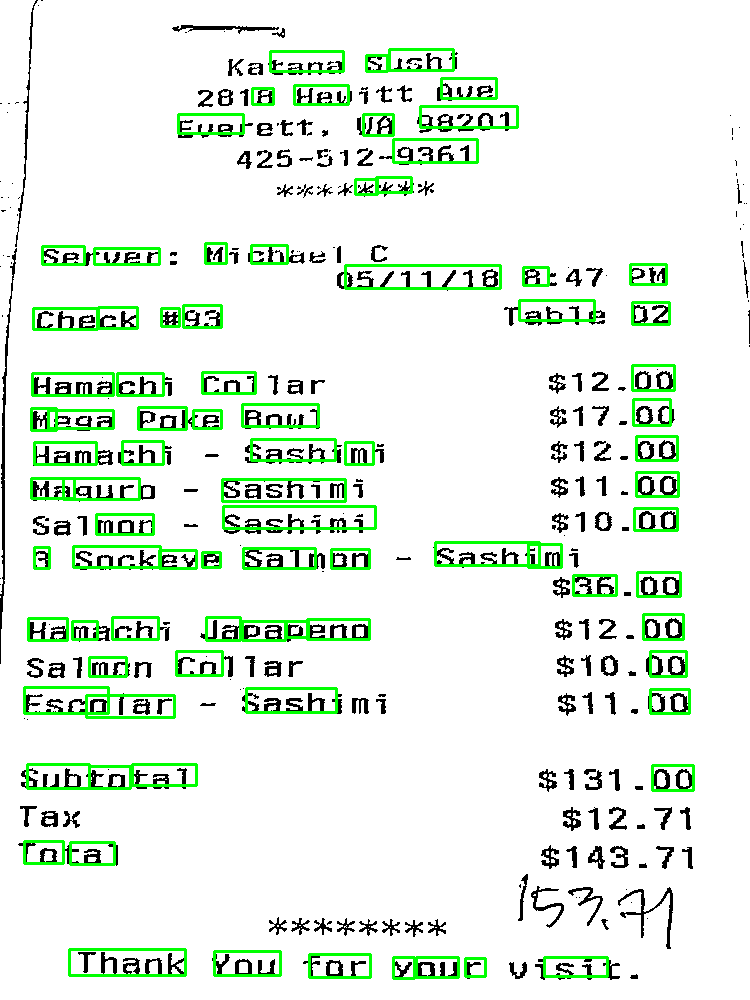

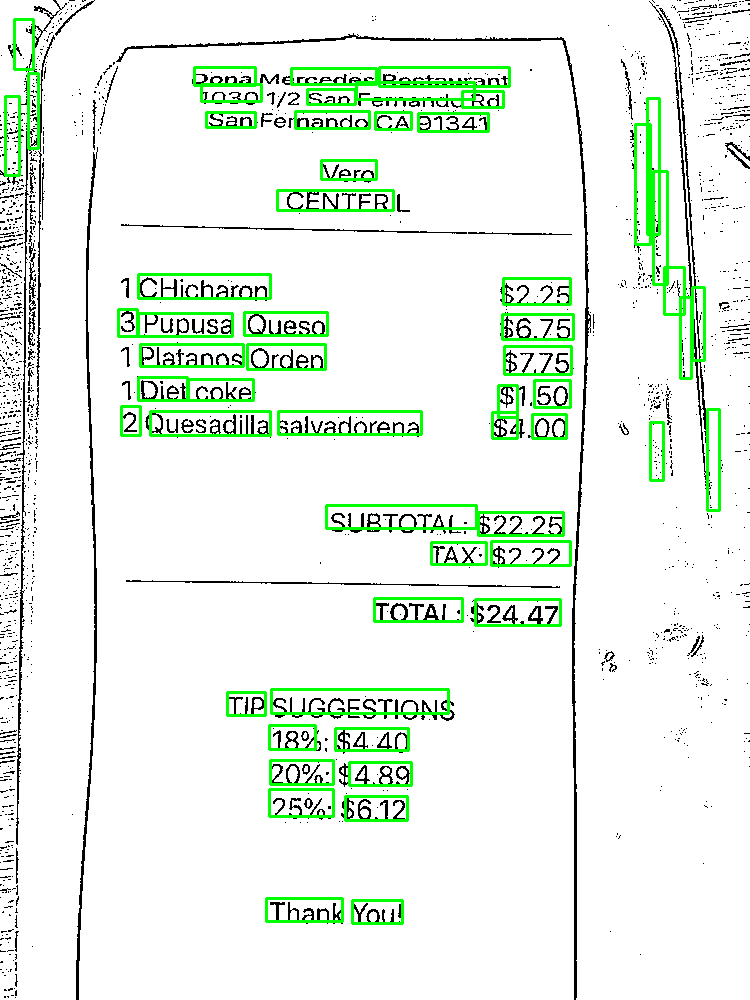

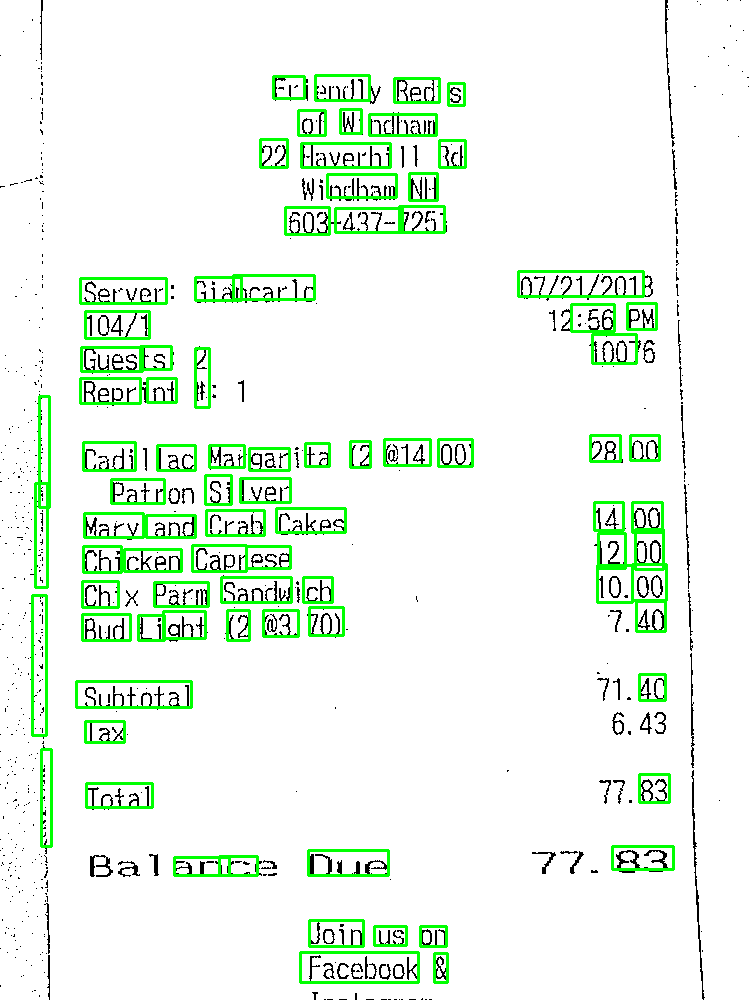

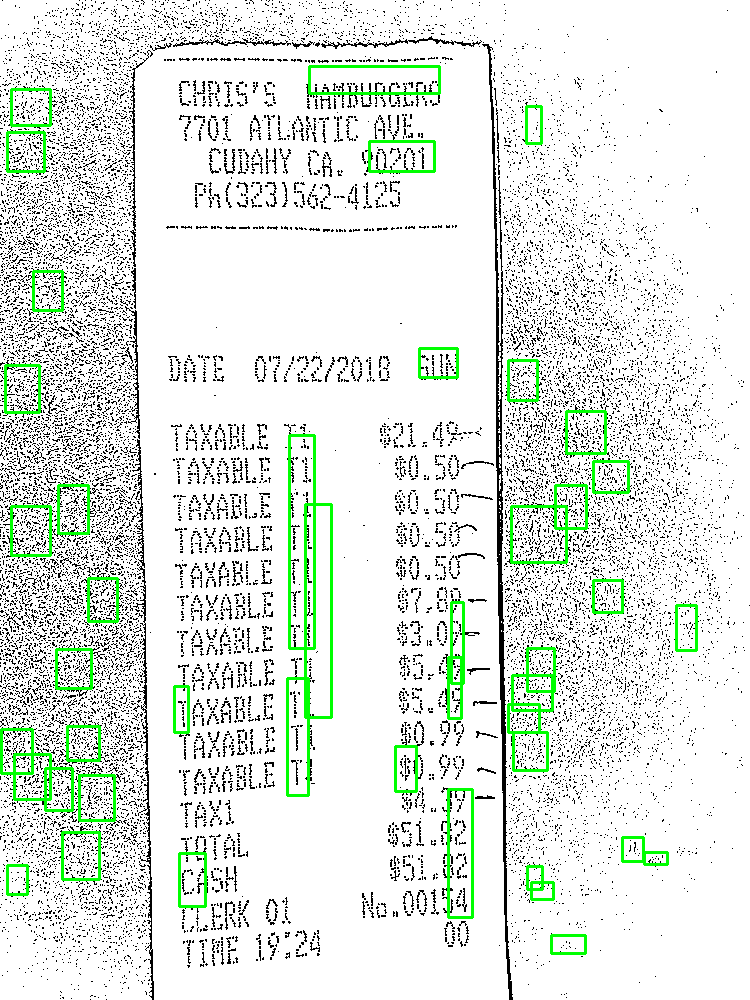

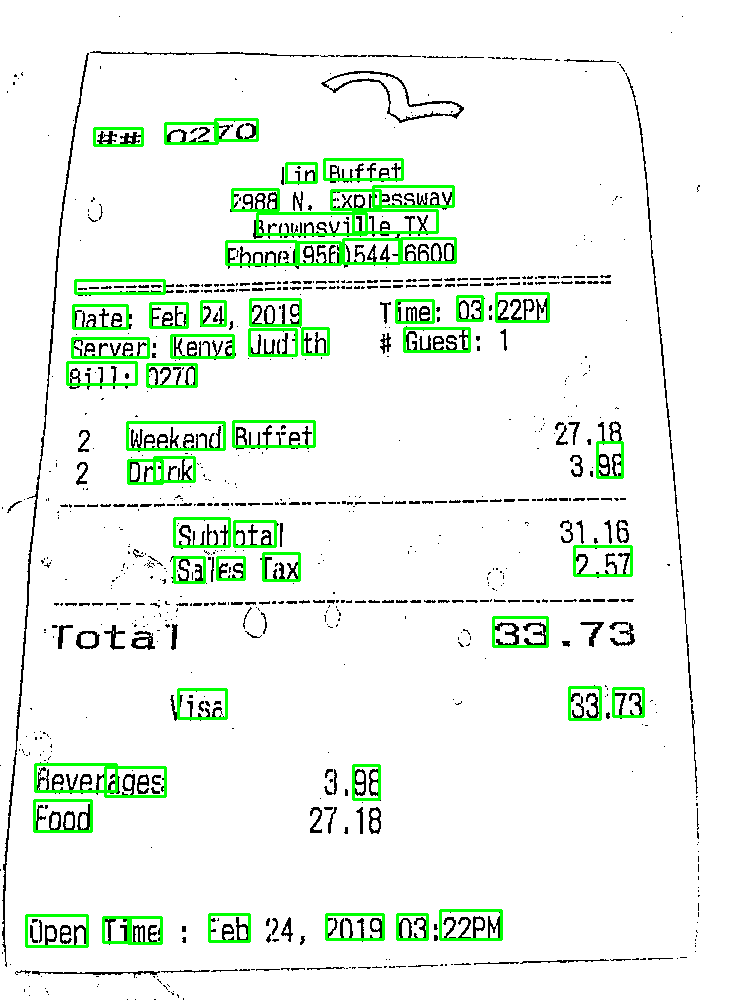

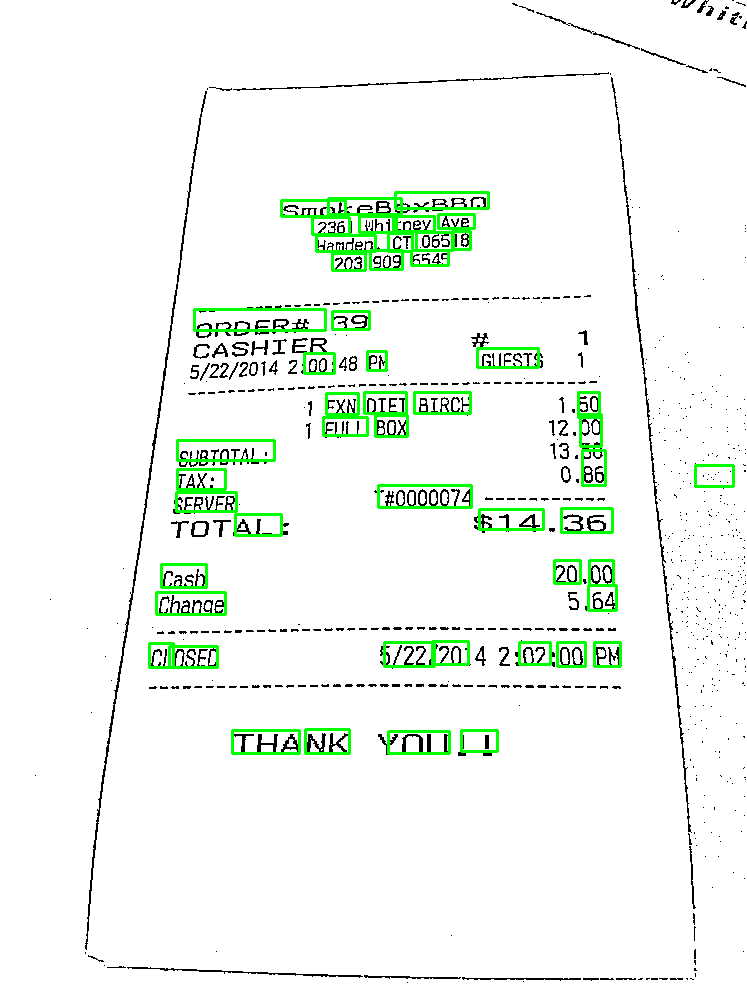

In [39]:
layerNames = [
	"feature_fusion/Conv_7/Sigmoid",
	"feature_fusion/concat_3"]

# load the pre-trained EAST text detector
print("[INFO] loading EAST text detector...")
net = cv2.dnn.readNet("./frozen_east_text_detection.pb")

for i in images:
  image = cv2.imread(i)

  # image = automatic_brightness_and_contrast(image)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  T = threshold_local(image, 11, offset = 10, method = "gaussian")
  image = (image > T).astype("uint8") * 255
  image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

  orig = image.copy()

  (H, W) = image.shape[:2]
  (newW, newH) = (1280, 1280)
  rW = W / float(newW)
  rH = H / float(newH)
  image = cv2.resize(image, (newW, newH))
  (H, W) = image.shape[:2]
  blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),
	        (123.68, 116.78, 103.94), swapRB=True, crop=False)
  # start = time.time()
  net.setInput(blob)
  (scores, geometry) = net.forward(layerNames)
  # end = time.time()
  (numRows, numCols) = scores.shape[2:4]
  rects = []
  confidences = []

  # loop over the number of rows
  for y in range(0, numRows):
    # extract the scores (probabilities), followed by the geometrical
    # data used to derive potential bounding box coordinates that
    # surround text
    scoresData = scores[0, 0, y]
    xData0 = geometry[0, 0, y]
    xData1 = geometry[0, 1, y]
    xData2 = geometry[0, 2, y]
    xData3 = geometry[0, 3, y]
    anglesData = geometry[0, 4, y]

    # loop over the number of columns
    for x in range(0, numCols):
      # if our score does not have sufficient probability, ignore it
      #if scoresData[x] < args["min_confidence"]:
      if scoresData[x] < 0.3:
        continue

      # compute the offset factor as our resulting feature maps will
      # be 4x smaller than the input image
      (offsetX, offsetY) = (x * 4.0, y * 4.0)

      # extract the rotation angle for the prediction and then
      # compute the sin and cosine
      angle = anglesData[x]
      cos = np.cos(angle)
      sin = np.sin(angle)

      # use the geometry volume to derive the width and height of
      # the bounding box
      h = xData0[x] + xData2[x]
      w = xData1[x] + xData3[x]

      # compute both the starting and ending (x, y)-coordinates for
      # the text prediction bounding box
      endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
      endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
      startX = int(endX - w)
      startY = int(endY - h)

      # add the bounding box coordinates and probability score to
      # our respective lists
      rects.append((startX, startY, endX, endY))
      confidences.append(scoresData[x])

  # apply non-maxima suppression to suppress weak, overlapping bounding
  # boxes
  boxes = non_max_suppression(np.array(rects), probs=confidences)

  # loop over the bounding boxes
  for (startX, startY, endX, endY) in boxes:
    # scale the bounding box coordinates based on the respective
    # ratios
    startX = int(startX * rW)
    startY = int(startY * rH)
    endX = int(endX * rW)
    endY = int(endY * rH)

    # draw the bounding box on the image
    cv2.rectangle(orig, (startX, startY), (endX, endY), (0, 255, 0), 2)

  # show the output image
  cv2_imshow(orig)

In [35]:
def order_points(pts):
	# initialzie a list of coordinates that will be ordered
	# such that the first entry in the list is the top-left,
	# the second entry is the top-right, the third is the
	# bottom-right, and the fourth is the bottom-left
	rect = np.zeros((4, 2), dtype = "float32")
	# the top-left point will have the smallest sum, whereas
	# the bottom-right point will have the largest sum
	s = pts.sum(axis = 1)
	rect[0] = pts[np.argmin(s)]
	rect[2] = pts[np.argmax(s)]
	# now, compute the difference between the points, the
	# top-right point will have the smallest difference,
	# whereas the bottom-left will have the largest difference
	diff = np.diff(pts, axis = 1)
	rect[1] = pts[np.argmin(diff)]
	rect[3] = pts[np.argmax(diff)]
	# return the ordered coordinates
	return rect
  
def four_point_transform(image, pts):
	# obtain a consistent order of the points and unpack them
	# individually
	rect = order_points(pts)
	(tl, tr, br, bl) = rect
	# compute the width of the new image, which will be the
	# maximum distance between bottom-right and bottom-left
	# x-coordiates or the top-right and top-left x-coordinates
	widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
	widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
	maxWidth = max(int(widthA), int(widthB))
	# compute the height of the new image, which will be the
	# maximum distance between the top-right and bottom-right
	# y-coordinates or the top-left and bottom-left y-coordinates
	heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
	heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
	maxHeight = max(int(heightA), int(heightB))
	# now that we have the dimensions of the new image, construct
	# the set of destination points to obtain a "birds eye view",
	# (i.e. top-down view) of the image, again specifying points
	# in the top-left, top-right, bottom-right, and bottom-left
	# order
	dst = np.array([
		[0, 0],
		[maxWidth - 1, 0],
		[maxWidth - 1, maxHeight - 1],
		[0, maxHeight - 1]], dtype = "float32")
	# compute the perspective transform matrix and then apply it
	M = cv2.getPerspectiveTransform(rect, dst)
	warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
	# return the warped image
	return warped

In [32]:
test_imgs = ["1004-receipt.jpg", "1011-receipt.jpg", "1016-receipt.jpg"]

STEP 1: Edge Detection


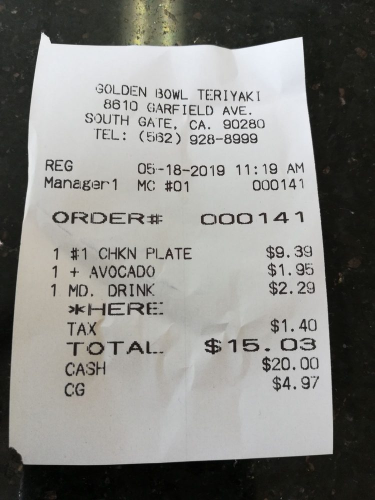

STEP 2: Find contours of paper


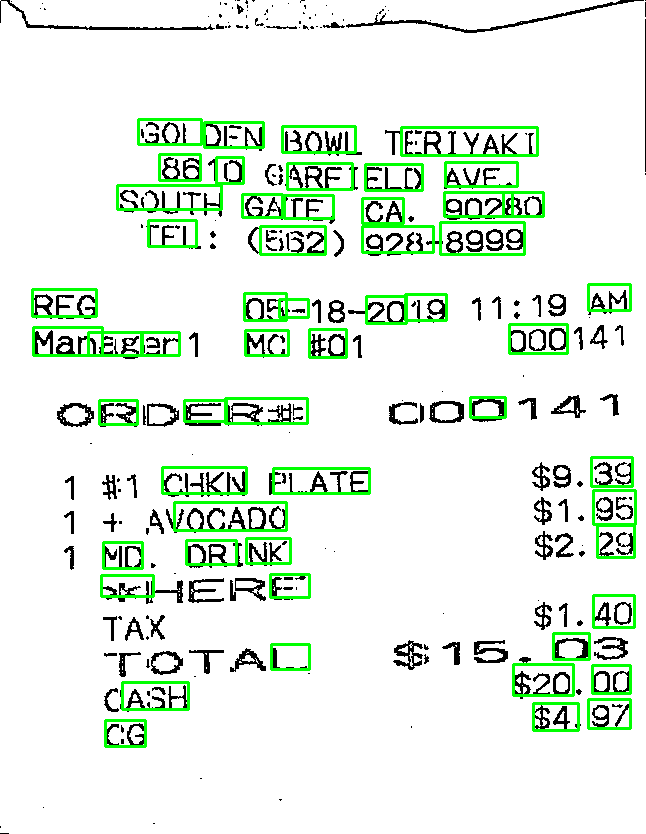

STEP 1: Edge Detection


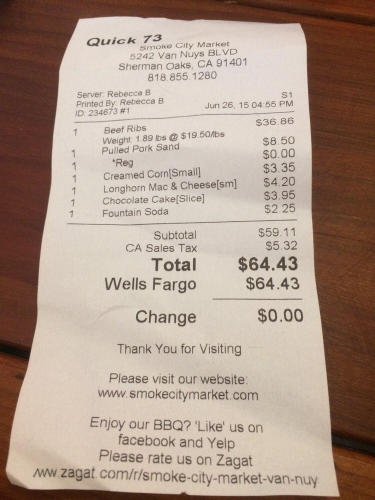

STEP 2: Find contours of paper


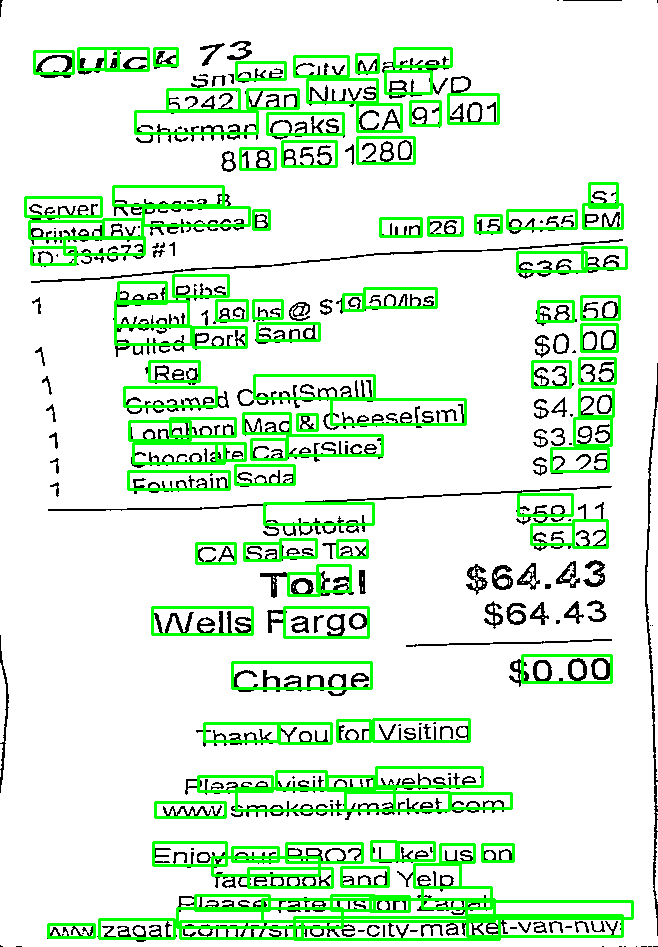

STEP 1: Edge Detection


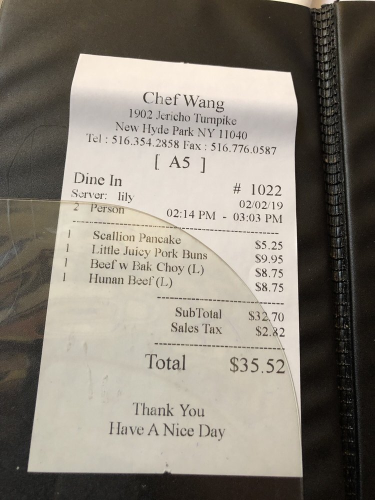

STEP 2: Find contours of paper


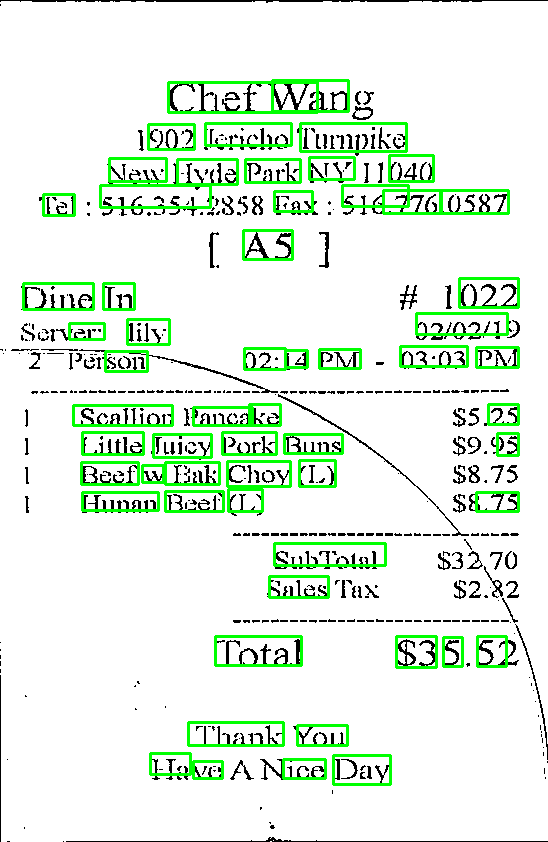

In [43]:
import imutils
from skimage.filters import threshold_local

for i in test_imgs:
  image = cv2.imread(i)
  ratio = image.shape[0] / 500.0
  orig = image.copy()
  image = imutils.resize(image, height = 500)
  # convert the image to grayscale, blur it, and find edges
  # in the image
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray = cv2.GaussianBlur(gray, (5, 5), 0)
  edged = cv2.Canny(gray, 75, 200)
  # show the original image and the edge detected image
  print("STEP 1: Edge Detection")
  cv2_imshow(image)
  # cv2_imshow(edged)

  cnts = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]
  s = False
  # loop over the contours
  for c in cnts:
    # approximate the contour
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    # if our approximated contour has four points, then we
    # can assume that we have found our screen
    if len(approx) == 4:
      screenCnt = approx
      s = True
      break
  if not s:
    print('lmfao')
    continue
  # show the contour (outline) of the piece of paper
  print("STEP 2: Find contours of paper")
  cv2.drawContours(image, [screenCnt], -1, (0, 255, 0), 2)
  # cv2_imshow(image)

  warped = four_point_transform(orig, screenCnt.reshape(4, 2) * ratio)
  # convert the warped image to grayscale, then threshold it
  # to give it that 'black and white' paper effect
  warped = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
  T = threshold_local(warped, 11, offset = 10, method = "gaussian")
  warped = (warped > T).astype("uint8") * 255

  # cv2_imshow(warped)
  image = warped
  image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
  orig = image.copy()
  (H, W) = image.shape[:2]
  (newW, newH) = (1280, 1280)
  rW = W / float(newW)
  rH = H / float(newH)
  image = cv2.resize(image, (newW, newH))
  (H, W) = image.shape[:2]
  blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),
	        (123.68, 116.78, 103.94), swapRB=True, crop=False)
  # start = time.time()
  net.setInput(blob)
  (scores, geometry) = net.forward(layerNames)
  # end = time.time()
  (numRows, numCols) = scores.shape[2:4]
  rects = []
  confidences = []

  # loop over the number of rows
  for y in range(0, numRows):
    # extract the scores (probabilities), followed by the geometrical
    # data used to derive potential bounding box coordinates that
    # surround text
    scoresData = scores[0, 0, y]
    xData0 = geometry[0, 0, y]
    xData1 = geometry[0, 1, y]
    xData2 = geometry[0, 2, y]
    xData3 = geometry[0, 3, y]
    anglesData = geometry[0, 4, y]

    # loop over the number of columns
    for x in range(0, numCols):
      # if our score does not have sufficient probability, ignore it
      #if scoresData[x] < args["min_confidence"]:
      if scoresData[x] < 0.3:
        continue

      # compute the offset factor as our resulting feature maps will
      # be 4x smaller than the input image
      (offsetX, offsetY) = (x * 4.0, y * 4.0)

      # extract the rotation angle for the prediction and then
      # compute the sin and cosine
      angle = anglesData[x]
      cos = np.cos(angle)
      sin = np.sin(angle)

      # use the geometry volume to derive the width and height of
      # the bounding box
      h = xData0[x] + xData2[x]
      w = xData1[x] + xData3[x]

      # compute both the starting and ending (x, y)-coordinates for
      # the text prediction bounding box
      endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
      endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
      startX = int(endX - w)
      startY = int(endY - h)

      # add the bounding box coordinates and probability score to
      # our respective lists
      rects.append((startX, startY, endX, endY))
      confidences.append(scoresData[x])

  # apply non-maxima suppression to suppress weak, overlapping bounding
  # boxes
  boxes = non_max_suppression(np.array(rects), probs=confidences)

  # loop over the bounding boxes
  for (startX, startY, endX, endY) in boxes:
    # scale the bounding box coordinates based on the respective
    # ratios
    startX = int(startX * rW)
    startY = int(startY * rH)
    endX = int(endX * rW)
    endY = int(endY * rH)

    # draw the bounding box on the image
    cv2.rectangle(orig, (startX, startY), (endX, endY), (0, 255, 0), 2)

  # show the output image
  cv2_imshow(orig)
